In [ ]:
import torch, torchvision, os, PIL, pdb
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import random
import torch.nn.utils.spectral_norm as spectral_norm

In [ ]:
from google.colab import files
files.upload()

In [ ]:
!pip install -q kaggle

!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d splcher/animefacedataset

!unzip animefacedataset.zip -d animefacedataset

In [ ]:
print(os.listdir())

['.config', 'animefacedataset', 'data', 'animefacedataset.zip', 'sample_data']


In [ ]:
print(os.listdir('animefacedataset'))

['images', 'filtered_images']


In [ ]:
data_dir = 'animefacedataset/images'

In [ ]:
# Determine the appropriate resolution for preprocessing by analyzing the size of 1000 random images

all_images = os.listdir(data_dir)
len(all_images )

random_images = random.sample(all_images, 1000)

widths = []
heights = []

for img_name in random_images:
    img_path = os.path.join(data_dir, img_name)
    img = Image.open(img_path)
    width, height = img.size
    widths.append(width)
    heights.append(height)

avg_width = np.mean(widths)
avg_height = np.mean(heights)

print(f"Average Width: {avg_width}")
print(f"Average height: {avg_height}")


Average Width: 90.38
Average height: 90.379


In [ ]:
# Parameters

n_epochs=200
batch_size=128
img_size=128
z_dim=200
d_dim=16
device='cuda'

image_size=128

cur_step=0
crit_cycles=5
gen_losses=[]
crit_losses=[]
show_step=500
save_step=50
info_step=100
real_show_step=5000

In [ ]:
# Filter and copy images that fall within the specified resolution range (100x100 to 140x140)

output_dir = 'animefacedataset/filtered_images/'

os.makedirs(output_dir, exist_ok=True)
all_images = os.listdir(data_dir)

filtered_count = 0

for img_name in all_images:
    img_path = os.path.join(data_dir, img_name)
    img = Image.open(img_path)
    width, height = img.size
    if 140 >= width >= 100 and 140 >= height >= 100:
        img.save(os.path.join(output_dir, img_name))
        filtered_count += 1

print(f"Total number of filtered and copied images: {filtered_count}")

Total number of filtered and copied images: 18288


In [ ]:
# Formula for new width and height after ConvTranspose2d:
# new_width = (old_width - 1) * stride - 2 * padding + kernel_size
# new_height = (old_height - 1) * stride - 2 * padding + kernel_size

In [ ]:
# Generator

class Generator(nn.Module):
  def __init__(self, z_dim=z_dim, d_dim=d_dim):
    super(Generator, self).__init__()
    self.z_dim = z_dim

    def genBlock(in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(True)
        )

    def extraBlock(in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(True)
        )

    self.gen = nn.Sequential(
        genBlock(z_dim, d_dim * 32, 4, 1, 0),  # 1x1 -> 4x4 (channels: z_dim -> 512)
        genBlock(d_dim * 32, d_dim * 16, 4, 2, 1),  # 4x4 -> 8x8 (channels: 512 -> 256)
        extraBlock(d_dim * 16, d_dim * 16),  # 8x8 (channels: 256 -> 256)
        genBlock(d_dim * 16, d_dim * 8, 4, 2, 1),   # 8x8 -> 16x16 (channels: 256 -> 128)
        extraBlock(d_dim * 8, d_dim * 8),  # 16x16 (channels: 128 -> 128)
        genBlock(d_dim * 8, d_dim * 4, 4, 2, 1),  # 16x16 -> 32x32 (channels: 128 -> 64)
        genBlock(d_dim * 4, d_dim * 2, 4, 2, 1),  # 32x32 -> 64x64 (channels: 64 -> 32)
        nn.ConvTranspose2d(d_dim * 2, 3, 4, 2, 1),  # 64x64 -> 128x128 (channels: 32 -> 3)
        nn.Tanh()  # Output in range [-1, 1]
    )


  def forward(self, noise):
    x = noise.view(len(noise), self.z_dim, 1, 1)  # Reshape noise into the initial 1x1 image
    return self.gen(x)

def gen_noise(num, z_dim, device='cuda'):
   return torch.randn(num, z_dim, device=device)

In [ ]:
# Formula for new width and height after Conv2d:
# new_width = (old_width + 2*padding - kernel_size) // stride + 1
# new_height = (old_height + 2*padding - kernel_size) // stride + 1


In [ ]:
# Critic

class Critic(nn.Module):
  def __init__(self, d_dim=d_dim):
    super(Critic, self).__init__()

    def critBlock(in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2)
        )

    self.crit = nn.Sequential(
        critBlock(3, d_dim, 4, 2, 1),  # 128x128 -> 64x64 (channels: 3 -> 16)
        critBlock(d_dim, d_dim*2, 4, 2, 1),  # 64x64 -> 32x32 (channels: 16 -> 32)
        critBlock(d_dim*2, d_dim*4, 4, 2, 1),  # 32x32 -> 16x16 (channels: 32 -> 64)
        critBlock(d_dim*4, d_dim*8, 4, 2, 1),  # 16x16 -> 8x8 (channels: 64 -> 128)
        critBlock(d_dim*8, d_dim*16, 4, 2, 1),  # 8x8 -> 4x4 (channels: 128 -> 256)
        spectral_norm(nn.Conv2d(d_dim*16, 1, 4, 1, 0))  # 4x4 -> 1x1 (channels: 256 -> 1)
    )

  def forward(self, image):
    crit_pred = self.crit(image)
    return crit_pred.view(len(crit_pred), -1)


In [ ]:
# Custom Dataset class to load, resize, and transform images for model training

class Dataset(Dataset): # CustomDataset ismine geç
    def __init__(self, path, size=img_size, lim=10000):
        self.sizes = (size, size)
        self.items = [os.path.join(path, data) for data in os.listdir(path)[:lim]]
        self.labels = [data for data in os.listdir(path)[:lim]]

        self.transform = transforms.Compose([
            transforms.Resize(self.sizes),
            transforms.ToTensor(),  # Automatically handles the 0-255 to 0-1 scaling
        ])

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        image = PIL.Image.open(self.items[idx]).convert('RGB')
        image = self.transform(image)
        return image, self.labels[idx]

ds = Dataset(output_dir)
dataloader = DataLoader(ds, batch_size=batch_size, shuffle=True)

In [ ]:
# gradient penalty

def get_gp(real, fake, crit, alpha, gamma=5):
  mix_images = real * alpha + fake * (1-alpha)
  mix_scores = crit(mix_images)

  gradient = torch.autograd.grad(
      inputs = mix_images,
      outputs = mix_scores,
      grad_outputs=torch.ones_like(mix_scores),
      retain_graph=True,
      create_graph=True,
  )[0]

  gradient = gradient.view(len(gradient), -1)
  gradient_norm = gradient.norm(2, dim=1)
  gp = gamma * ((gradient_norm-1)**2).mean()

  return gp

In [ ]:
root_path='./data/save_and_load/'
os.makedirs(root_path, exist_ok=True)

In [ ]:
# Save and load the latest model checkpoints (generator and critic) along with optimizer states

def save_checkpoint():
    try:
        torch.save({
            'epoch': epoch,
            'model_state_dict': gen.state_dict(),
            'optimizer_state_dict': gen_opt.state_dict(),
        }, f"{root_path}gen_model.pth")

        torch.save({
            'epoch': epoch,
            'model_state_dict': crit.state_dict(),
            'optimizer_state_dict': crit_opt.state_dict(),
        }, f"{root_path}crit_model.pth")

        print("Checkpoint saved successfully.")
    except Exception as e:
        print(f"Error saving checkpoint: {e}")

def load_checkpoint():
    try:
        gen_checkpoint = torch.load(f"{root_path}gen_model.pth")
        gen.load_state_dict(gen_checkpoint['model_state_dict'])
        gen_opt.load_state_dict(gen_checkpoint['optimizer_state_dict'])

        crit_checkpoint = torch.load(f"{root_path}crit_model.pth")
        crit.load_state_dict(crit_checkpoint['model_state_dict'])
        crit_opt.load_state_dict(crit_checkpoint['optimizer_state_dict'])

        print("Checkpoint loaded successfully.")
    except FileNotFoundError:
        print("Checkpoint file not found.")
    except Exception as e:
        print(f"Error loading checkpoint: {e}")


In [ ]:
def show(tensor, num=25,  name=''):
  data = tensor.detach().cpu()
  grid = make_grid(data[:num], nrow=5).permute(1,2,0)

  plt.imshow(grid.clip(0,1))
  plt.show()

In [ ]:
# He Initialization (Kaiming)

def weights_init_kaiming(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in', nonlinearity='leaky_relu')
    elif classname.find('Linear') != -1:
        nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in', nonlinearity='leaky_relu')
    elif classname.find('BatchNorm') != -1:
        nn.init.constant_(m.weight.data, 1.0)
        nn.init.constant_(m.bias.data, 0.0)

In [ ]:
# Initialize the Generator and Critic models and move them to the GPU
gen = Generator(z_dim).to(device)
crit = Critic().to(device)

# Apply He Initialization
gen.apply(weights_init_kaiming)
crit.apply(weights_init_kaiming)

# Set up Adam optimizers for both the Generator and Critic with specified learning rates and beta values
gen_opt = torch.optim.Adam(gen.parameters(), lr = 2e-4, betas=(0.5, 0.999))
crit_opt = torch.optim.Adam(crit.parameters(), lr = 5e-4, betas = (0.5, 0.999))

# StepLR scheduler to adjust the learning rate of the optimizers after a fixed number of steps
gen_scheduler = torch.optim.lr_scheduler.StepLR(gen_opt, step_size=3000, gamma=0.6)
crit_scheduler = torch.optim.lr_scheduler.StepLR(crit_opt, step_size=2500, gamma=0.7)

Epoch 0, Step 0: Generator Loss: 2.535183906555176, Critic Loss: -4.442350387573242


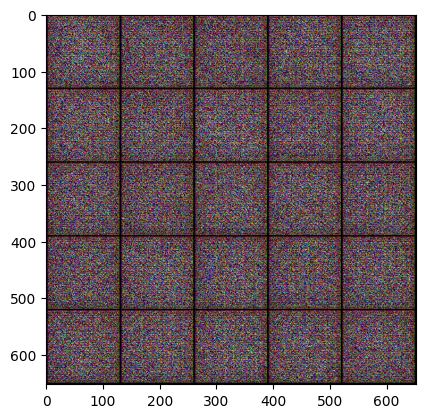

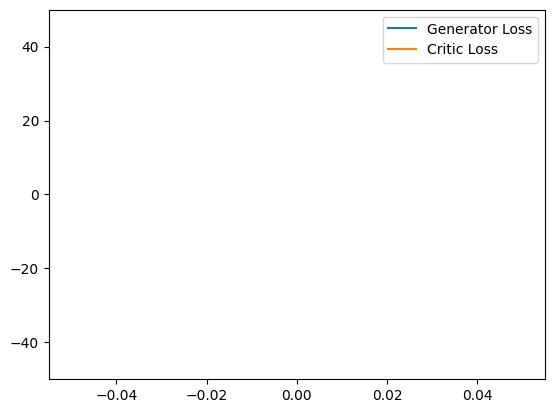

Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 1, Step 100: Generator Loss: 40.15688705444336, Critic Loss: -78.37105560302734
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 2, Step 200: Generator Loss: 31.987064361572266, Critic Loss: -47.284420013427734
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 3, Step 300: Generator Loss: 35.30801010131836, Critic Loss: -52.13564682006836
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 5, Step 400: Generator Loss: 36.12272644042969, Critic Loss: -45.93780517578125
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 6, Step 500: Generator Loss: 30.7058162689209, Critic Loss: -38.53989791870117


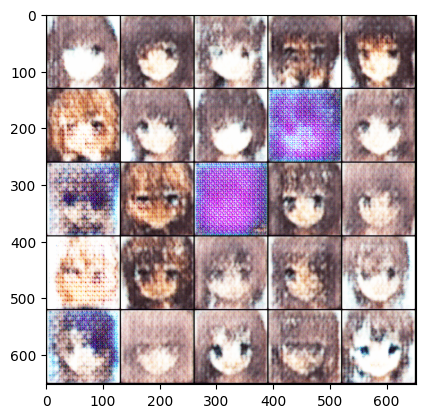

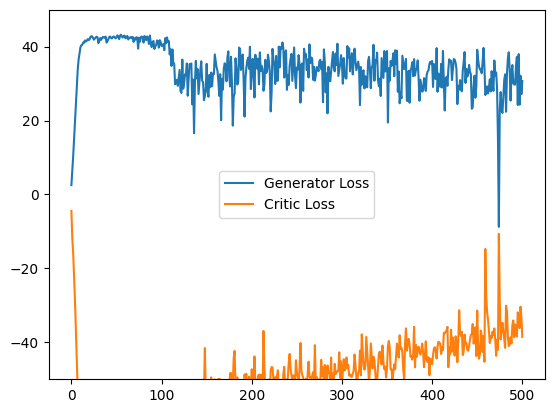

Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 7, Step 600: Generator Loss: 35.3031120300293, Critic Loss: -39.00596618652344
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 8, Step 700: Generator Loss: 17.639646530151367, Critic Loss: -22.37349510192871
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 10, Step 800: Generator Loss: 21.039243698120117, Critic Loss: -29.03505516052246
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 11, Step 900: Generator Loss: 21.796222686767578, Critic Loss: -26.67962646484375
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 12, Step 1000: Generator Loss: 21.703472137451172, Critic Loss: -24.40765380859375


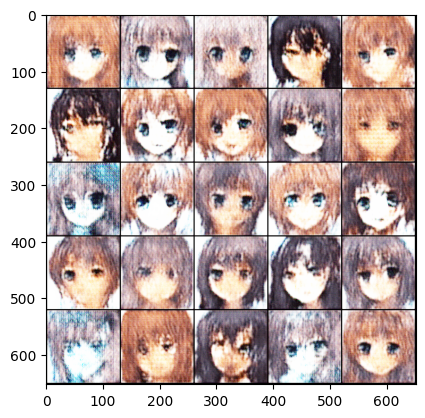

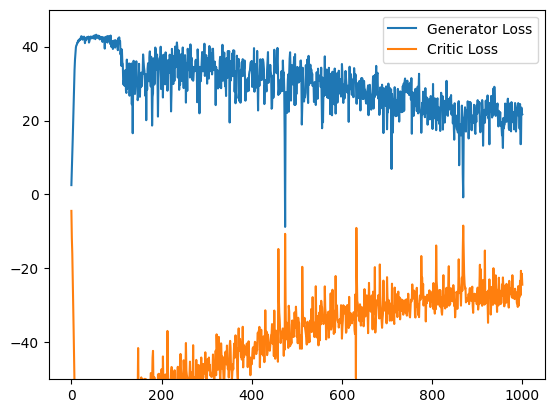

Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 13, Step 1100: Generator Loss: 16.01136016845703, Critic Loss: -22.774559020996094
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 15, Step 1200: Generator Loss: 20.55445671081543, Critic Loss: -24.0651912689209
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 16, Step 1300: Generator Loss: 20.013153076171875, Critic Loss: -26.444753646850586
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 17, Step 1400: Generator Loss: 20.336488723754883, Critic Loss: -25.831581115722656
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 18, Step 1500: Generator Loss: 14.748664855957031, Critic Loss: -23.83729362487793


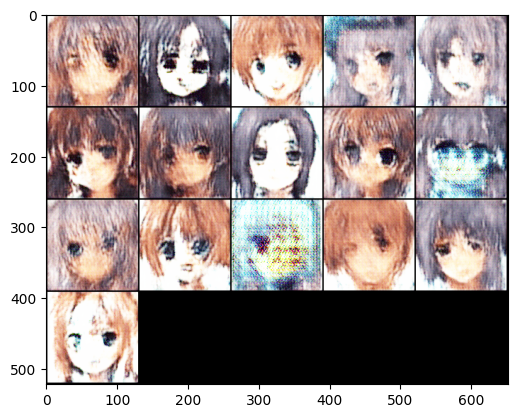

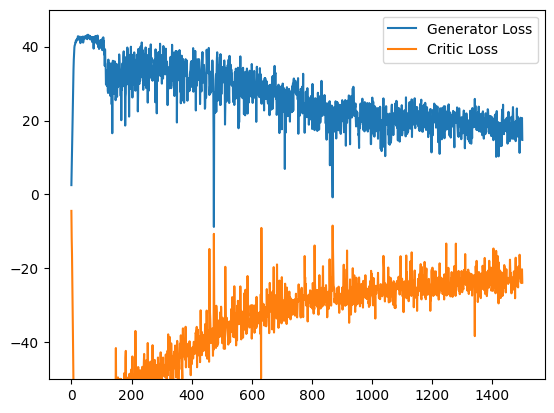

Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 20, Step 1600: Generator Loss: 17.838787078857422, Critic Loss: -20.976673126220703
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 21, Step 1700: Generator Loss: 18.91836166381836, Critic Loss: -23.8170166015625
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 22, Step 1800: Generator Loss: 17.189640045166016, Critic Loss: -20.85079002380371
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 24, Step 1900: Generator Loss: 17.373523712158203, Critic Loss: -20.15127944946289
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 25, Step 2000: Generator Loss: 14.839719772338867, Critic Loss: -17.935077667236328


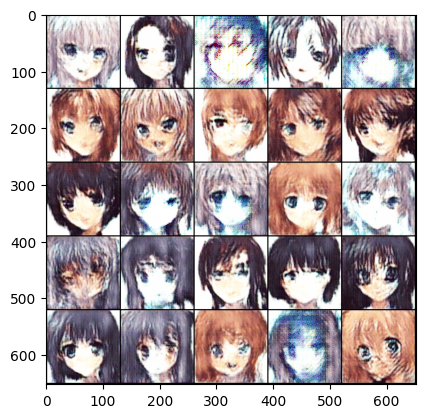

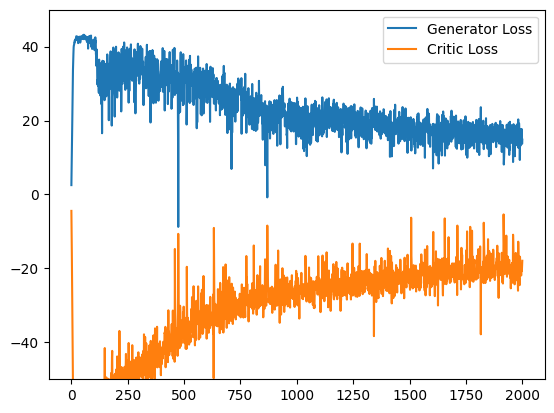

Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 26, Step 2100: Generator Loss: 15.811676025390625, Critic Loss: -14.558731079101562
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 27, Step 2200: Generator Loss: 16.936267852783203, Critic Loss: -20.297523498535156
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 29, Step 2300: Generator Loss: 14.165765762329102, Critic Loss: -20.300167083740234
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 30, Step 2400: Generator Loss: 15.062213897705078, Critic Loss: -17.420412063598633
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 31, Step 2500: Generator Loss: 12.712207794189453, Critic Loss: -13.929479598999023


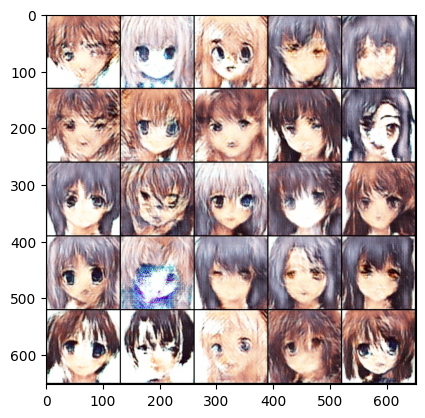

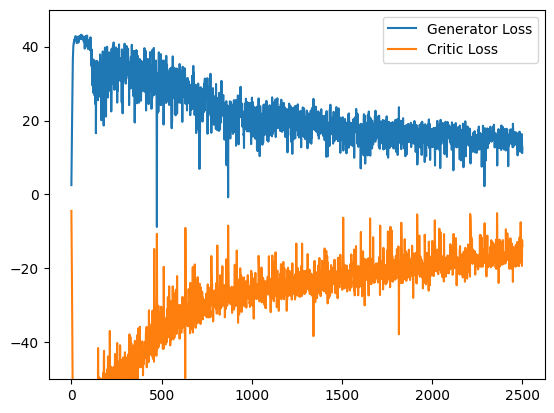

Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 32, Step 2600: Generator Loss: 17.31124496459961, Critic Loss: -17.129619598388672
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 34, Step 2700: Generator Loss: 15.725321769714355, Critic Loss: -14.352729797363281
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 35, Step 2800: Generator Loss: 14.078119277954102, Critic Loss: -17.396461486816406
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 36, Step 2900: Generator Loss: 13.141775131225586, Critic Loss: -16.644670486450195
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 37, Step 3000: Generator Loss: 12.182065963745117, Critic Loss: -16.842037200927734


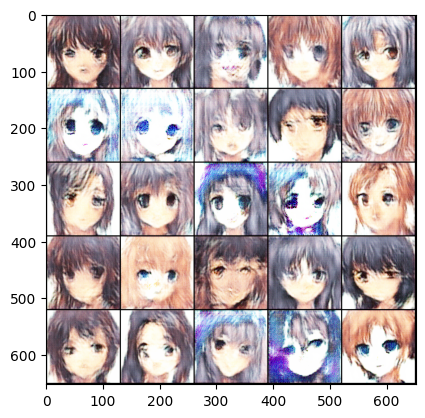

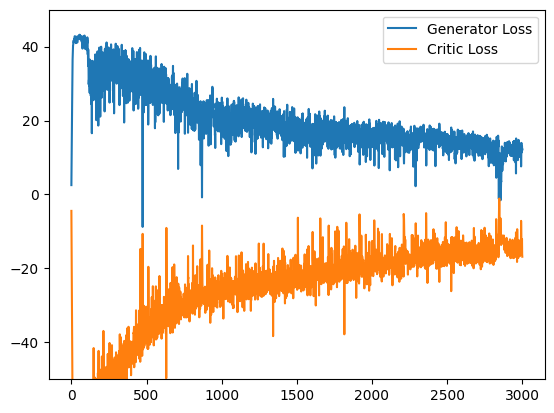

Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 39, Step 3100: Generator Loss: 12.660436630249023, Critic Loss: -15.47414779663086
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 40, Step 3200: Generator Loss: 12.080550193786621, Critic Loss: -15.7479248046875
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 41, Step 3300: Generator Loss: 13.24725341796875, Critic Loss: -14.540149688720703
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 43, Step 3400: Generator Loss: 13.68740177154541, Critic Loss: -12.504262924194336
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 44, Step 3500: Generator Loss: 10.922689437866211, Critic Loss: -13.036916732788086


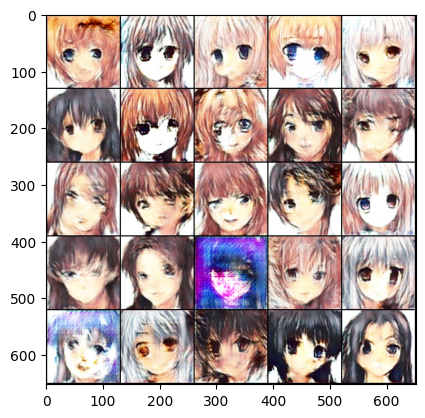

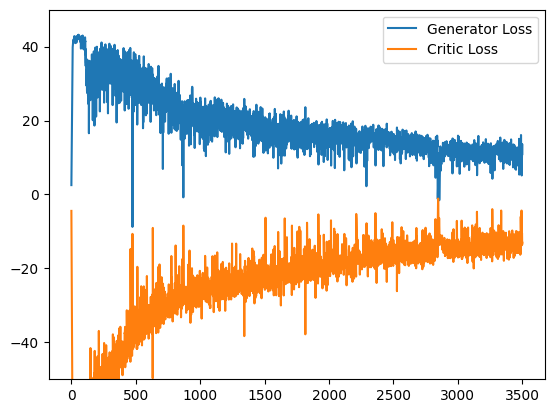

Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 45, Step 3600: Generator Loss: 11.389833450317383, Critic Loss: -15.527732849121094
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 46, Step 3700: Generator Loss: 11.424371719360352, Critic Loss: -12.196557998657227
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 48, Step 3800: Generator Loss: 12.46102523803711, Critic Loss: -13.79499340057373
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 49, Step 3900: Generator Loss: 10.894817352294922, Critic Loss: -11.813614845275879
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 50, Step 4000: Generator Loss: 8.983903884887695, Critic Loss: -13.44127082824707


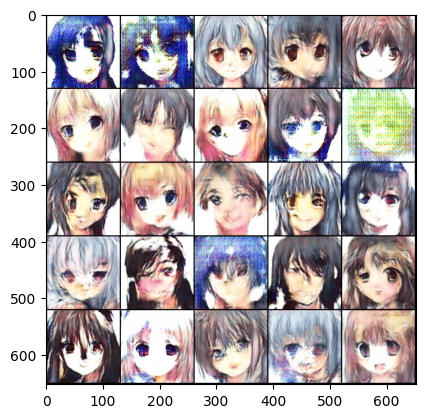

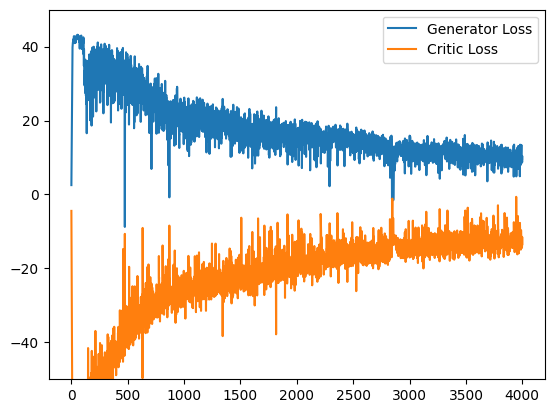

Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 51, Step 4100: Generator Loss: 11.164551734924316, Critic Loss: -11.334371566772461
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 53, Step 4200: Generator Loss: 9.063846588134766, Critic Loss: -9.194127082824707
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 54, Step 4300: Generator Loss: 9.52232551574707, Critic Loss: -12.130788803100586
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 55, Step 4400: Generator Loss: 9.708885192871094, Critic Loss: -11.738182067871094
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 56, Step 4500: Generator Loss: 7.998181343078613, Critic Loss: -11.300954818725586


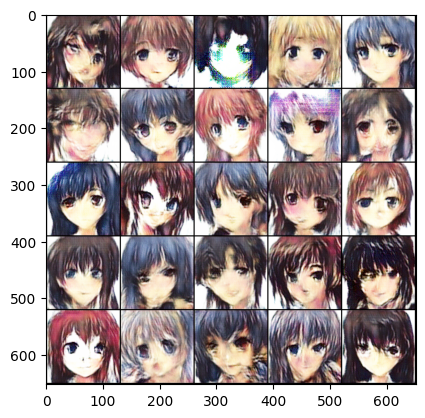

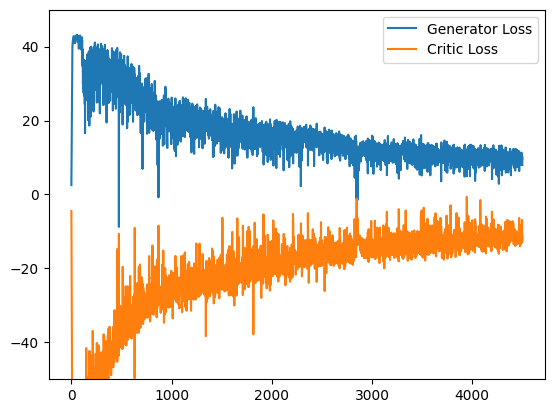

Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 58, Step 4600: Generator Loss: 8.43529987335205, Critic Loss: -13.380769729614258
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 59, Step 4700: Generator Loss: 8.22254467010498, Critic Loss: -11.82568359375
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 60, Step 4800: Generator Loss: 7.948025703430176, Critic Loss: -10.540186882019043
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 62, Step 4900: Generator Loss: 11.357765197753906, Critic Loss: -11.171570777893066
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 63, Step 5000: Generator Loss: 6.816361904144287, Critic Loss: -11.956514358520508


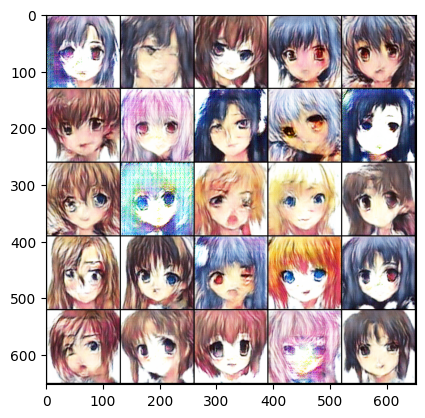

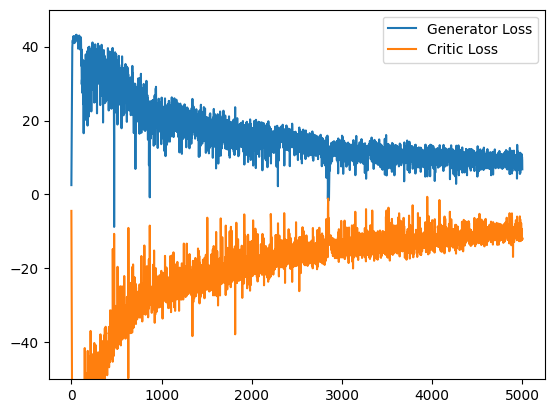

Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 64, Step 5100: Generator Loss: 9.014888763427734, Critic Loss: -11.354133605957031
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 65, Step 5200: Generator Loss: 7.45847749710083, Critic Loss: -12.189247131347656
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 67, Step 5300: Generator Loss: 8.420108795166016, Critic Loss: -10.27095890045166
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 68, Step 5400: Generator Loss: 6.996729850769043, Critic Loss: -7.302864074707031
Checkpoint saved successfully.
Checkpoint saved successfully.


------------ Critic LR has changed: 0.0005 -> 0.00035 (Epoch 69 - Step 5499) ------------
Epoch 69, Step 5500: Generator Loss: 9.20506477355957, Critic Loss: -9.606123924255371


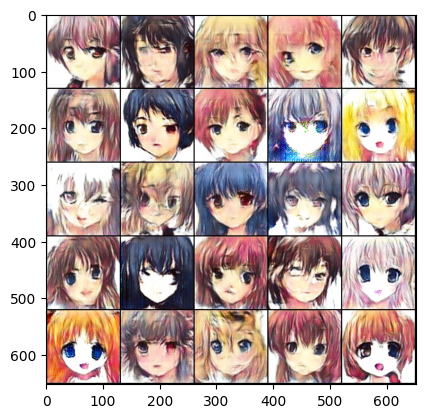

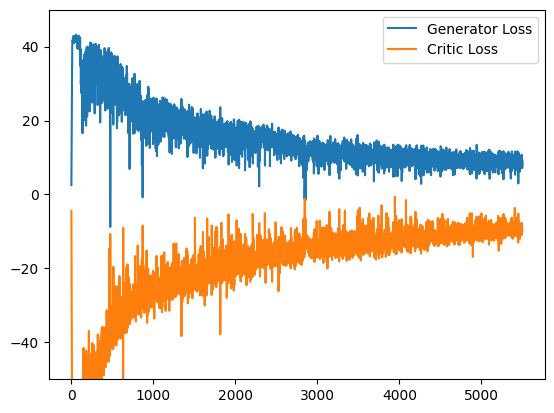

Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 70, Step 5600: Generator Loss: 8.674617767333984, Critic Loss: -10.219554901123047
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 72, Step 5700: Generator Loss: 8.44924545288086, Critic Loss: -9.160573959350586
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 73, Step 5800: Generator Loss: 8.445098876953125, Critic Loss: -9.565606117248535
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 74, Step 5900: Generator Loss: 10.700227737426758, Critic Loss: -6.393407821655273
Checkpoint saved successfully.


Checkpoint saved successfully.
------------ Generator LR has changed: 0.0002 -> 0.00012 (Epoch 75 - Step 5999) ------------
Epoch 75, Step 6000: Generator Loss: 9.127937316894531, Critic Loss: -8.519831657409668


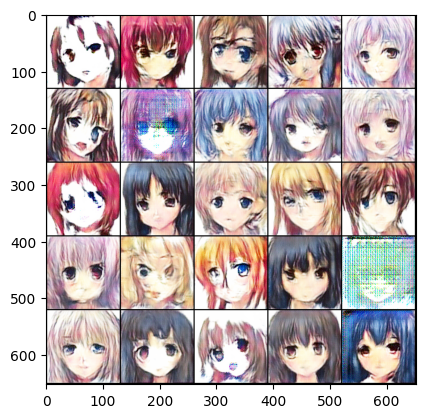

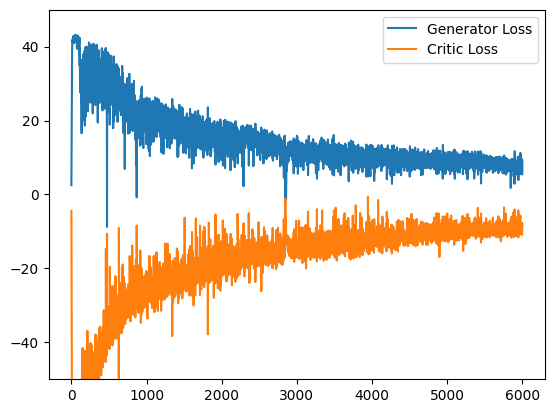

Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 77, Step 6100: Generator Loss: 8.593280792236328, Critic Loss: -8.963340759277344
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 78, Step 6200: Generator Loss: 7.65384578704834, Critic Loss: -8.937105178833008
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 79, Step 6300: Generator Loss: 8.686203956604004, Critic Loss: -6.4892473220825195
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 81, Step 6400: Generator Loss: 6.76540470123291, Critic Loss: -3.8806991577148438
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 82, Step 6500: Generator Loss: 6.792367935180664, Critic Loss: -7.535621643066406


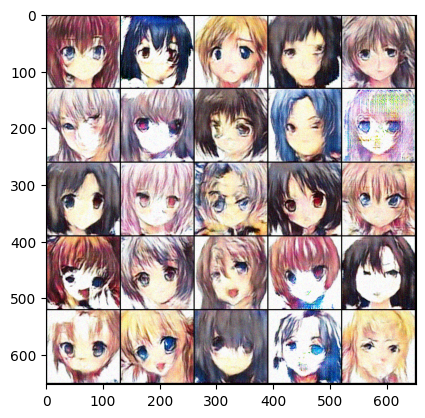

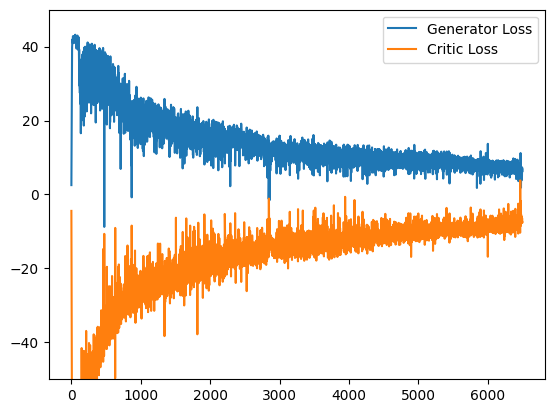

Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 83, Step 6600: Generator Loss: 8.727848052978516, Critic Loss: -8.986385345458984
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 84, Step 6700: Generator Loss: 5.531561851501465, Critic Loss: -7.460640907287598
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 86, Step 6800: Generator Loss: 7.487943649291992, Critic Loss: -8.327970504760742
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 87, Step 6900: Generator Loss: 6.718381881713867, Critic Loss: -7.269283771514893
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 88, Step 7000: Generator Loss: 6.842834949493408, Critic Loss: -6.2947282791137695


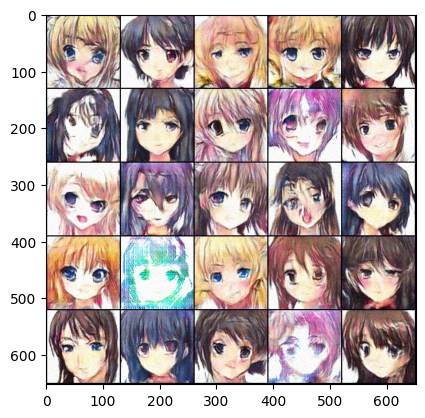

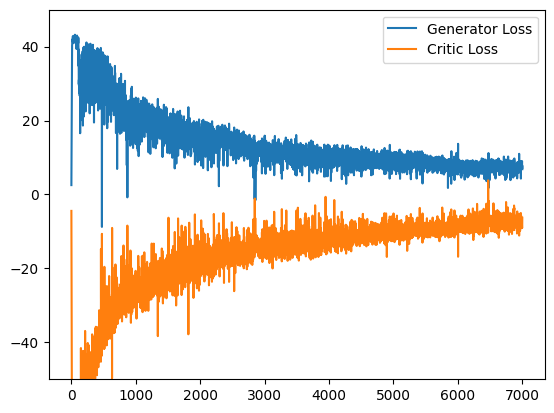

Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 89, Step 7100: Generator Loss: 6.256606101989746, Critic Loss: -5.377593040466309
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 91, Step 7200: Generator Loss: 6.3600287437438965, Critic Loss: -8.99168872833252
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 92, Step 7300: Generator Loss: 7.758871078491211, Critic Loss: -7.508118629455566
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 93, Step 7400: Generator Loss: 6.4684953689575195, Critic Loss: -6.365067958831787
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 94, Step 7500: Generator Loss: 8.532608985900879, Critic Loss: -8.051989555358887


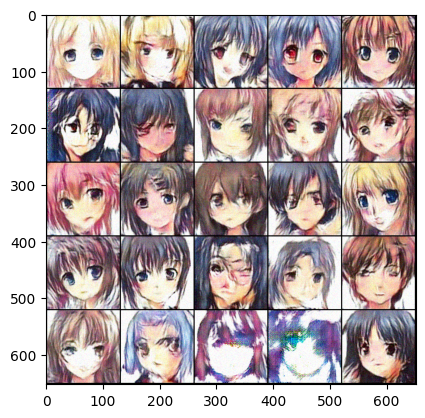

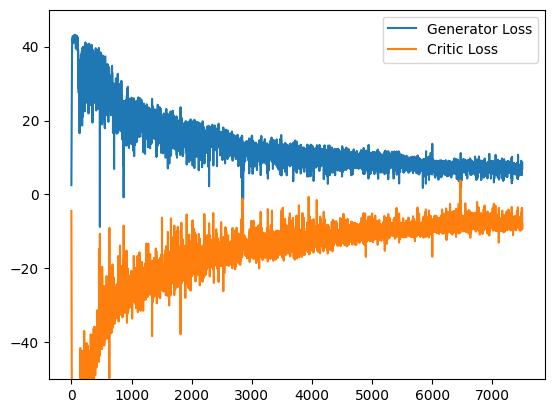

Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 96, Step 7600: Generator Loss: 8.280552864074707, Critic Loss: -7.3318586349487305
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 97, Step 7700: Generator Loss: 8.322090148925781, Critic Loss: -7.739984512329102
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 98, Step 7800: Generator Loss: 9.29332160949707, Critic Loss: -7.696307182312012
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 100, Step 7900: Generator Loss: 6.34782075881958, Critic Loss: -6.374417304992676
Checkpoint saved successfully.
Checkpoint saved successfully.


------------ Critic LR has changed: 0.00035 -> 0.000245 (Epoch 101 - Step 7999) ------------
Epoch 101, Step 8000: Generator Loss: 7.1723856925964355, Critic Loss: -7.693137168884277


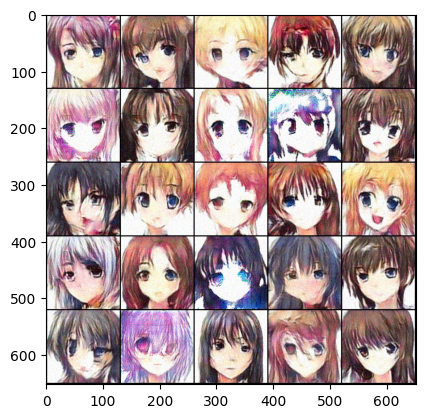

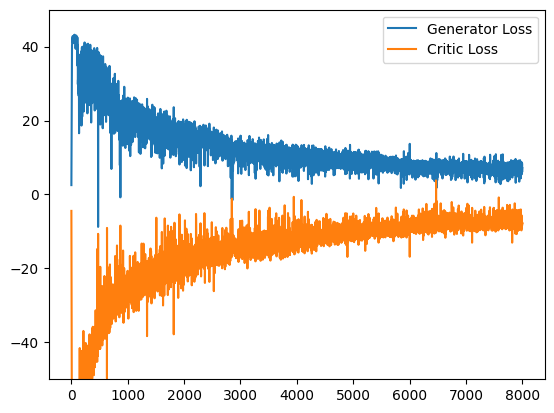

Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 102, Step 8100: Generator Loss: 5.59804630279541, Critic Loss: -4.838624954223633
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 103, Step 8200: Generator Loss: 7.789803504943848, Critic Loss: -7.909782886505127
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 105, Step 8300: Generator Loss: 5.942043304443359, Critic Loss: -8.865817070007324
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 106, Step 8400: Generator Loss: 7.028129577636719, Critic Loss: -8.467671394348145
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 107, Step 8500: Generator Loss: 7.244880676269531, Critic Loss: -7.774862766265869


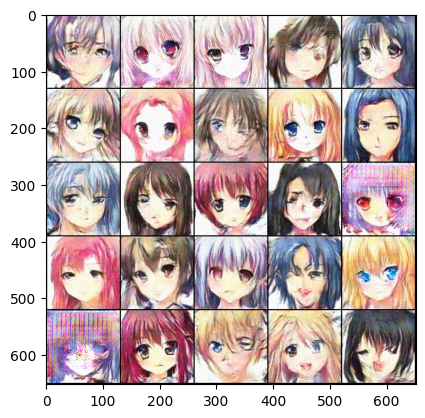

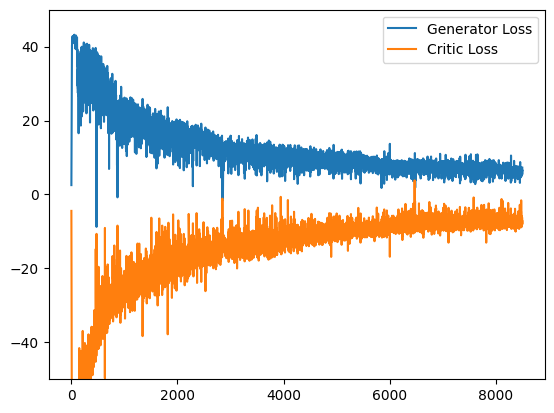

Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 108, Step 8600: Generator Loss: 6.2400031089782715, Critic Loss: -5.373421669006348
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 110, Step 8700: Generator Loss: 8.307449340820312, Critic Loss: -6.747949123382568
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 111, Step 8800: Generator Loss: 6.664462089538574, Critic Loss: -6.326944351196289
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 112, Step 8900: Generator Loss: 5.414471626281738, Critic Loss: -4.30716609954834
Checkpoint saved successfully.


Checkpoint saved successfully.
------------ Generator LR has changed: 0.00012 -> 7.2e-05 (Epoch 113 - Step 8999) ------------
Epoch 113, Step 9000: Generator Loss: 6.866909503936768, Critic Loss: -7.645901203155518


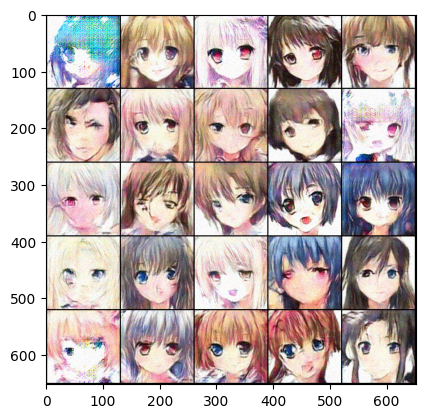

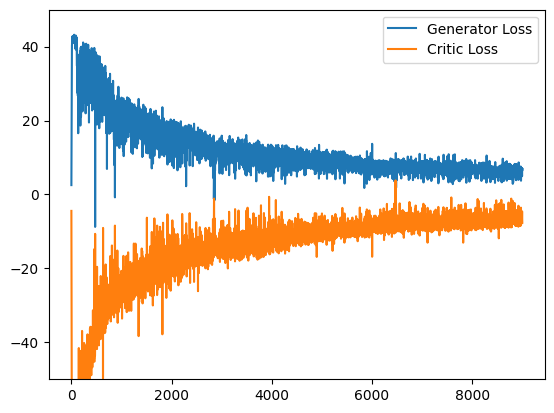

Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 115, Step 9100: Generator Loss: 7.276706218719482, Critic Loss: -6.765430927276611
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 116, Step 9200: Generator Loss: 7.532622337341309, Critic Loss: -4.824783802032471
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 117, Step 9300: Generator Loss: 7.971243381500244, Critic Loss: -7.109417915344238
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 118, Step 9400: Generator Loss: 7.664488315582275, Critic Loss: -6.570440769195557
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 120, Step 9500: Generator Loss: 5.253866195678711, Critic Loss: -5.34112548828125


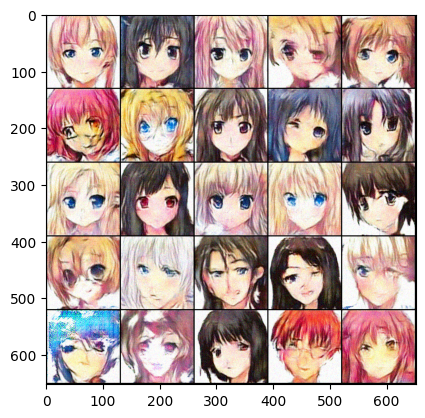

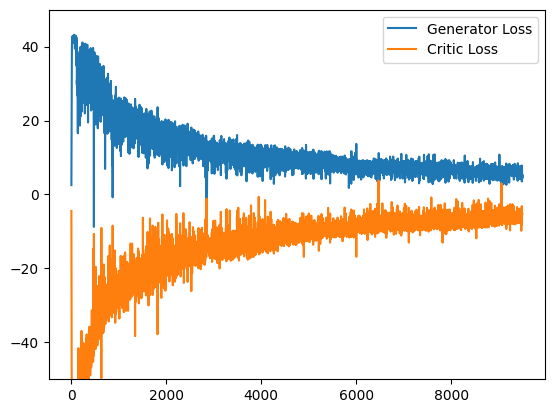

Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 121, Step 9600: Generator Loss: 6.5791239738464355, Critic Loss: -6.491697311401367
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 122, Step 9700: Generator Loss: 6.470946311950684, Critic Loss: -5.868621826171875
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 124, Step 9800: Generator Loss: 6.169449806213379, Critic Loss: -4.119345188140869
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 125, Step 9900: Generator Loss: 6.355603218078613, Critic Loss: -6.815922260284424
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 126, Step 10000: Generator Loss: 7.990068435668945, Critic Loss: -6.994928359985352


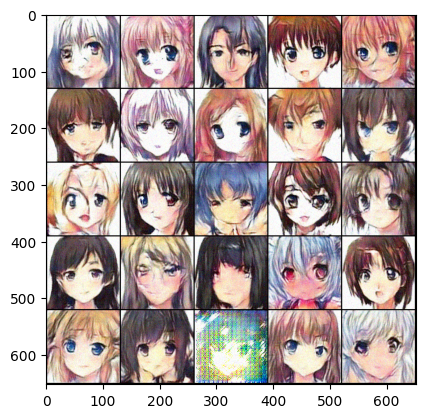

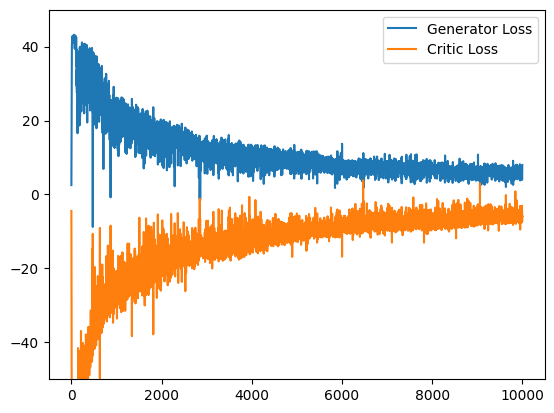

Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 127, Step 10100: Generator Loss: 7.292022228240967, Critic Loss: -6.663533687591553
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 129, Step 10200: Generator Loss: 6.917402744293213, Critic Loss: -6.152367115020752
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 130, Step 10300: Generator Loss: 7.230598449707031, Critic Loss: -6.184235572814941
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 131, Step 10400: Generator Loss: 7.800495147705078, Critic Loss: -6.277577877044678
Checkpoint saved successfully.


Checkpoint saved successfully.
------------ Critic LR has changed: 0.000245 -> 0.0001715 (Epoch 132 - Step 10499) ------------
Epoch 132, Step 10500: Generator Loss: 6.466358184814453, Critic Loss: -4.471167087554932


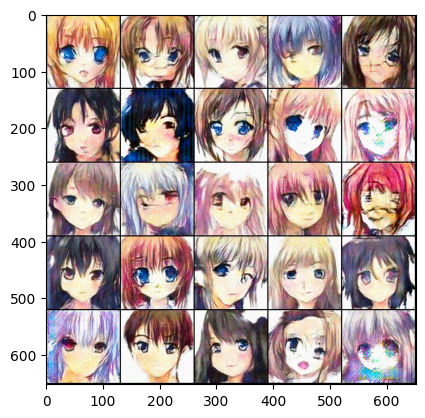

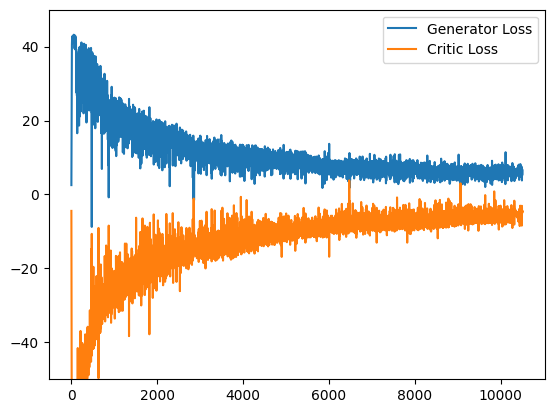

Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 134, Step 10600: Generator Loss: 6.434623718261719, Critic Loss: -6.353529930114746
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 135, Step 10700: Generator Loss: 7.155330657958984, Critic Loss: -5.6236724853515625
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 136, Step 10800: Generator Loss: 6.940177917480469, Critic Loss: -7.28635835647583
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 137, Step 10900: Generator Loss: 6.6808247566223145, Critic Loss: -7.169663429260254
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 139, Step 11000: Generator Loss: 7.366807460784912, Critic Loss: -5.7435126304626465


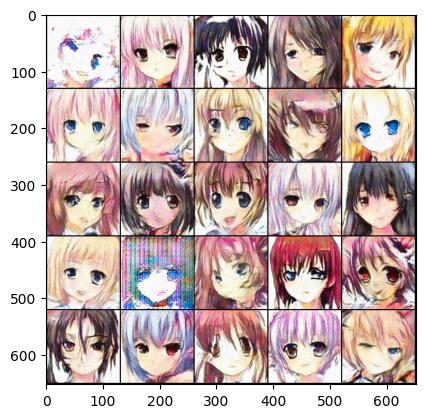

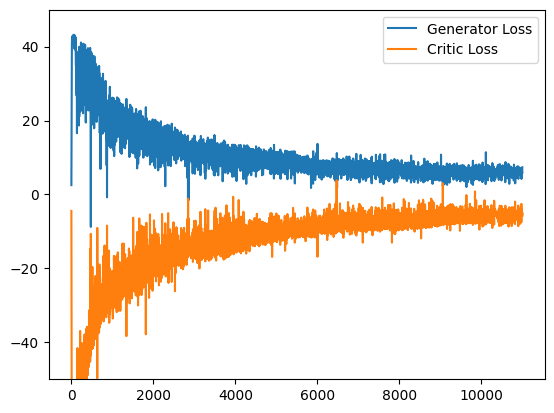

Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 140, Step 11100: Generator Loss: 6.072713851928711, Critic Loss: -4.6123199462890625
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 141, Step 11200: Generator Loss: 6.673608303070068, Critic Loss: -6.321822166442871
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 143, Step 11300: Generator Loss: 7.225715637207031, Critic Loss: -4.4195685386657715
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 144, Step 11400: Generator Loss: 7.733334064483643, Critic Loss: -6.860200881958008
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 145, Step 11500: Generator Loss: 7.272969722747803, Critic Loss: -7.538358211517334


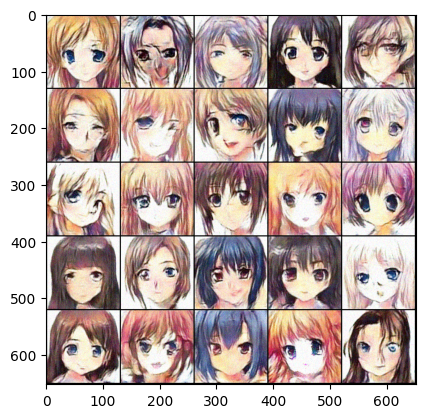

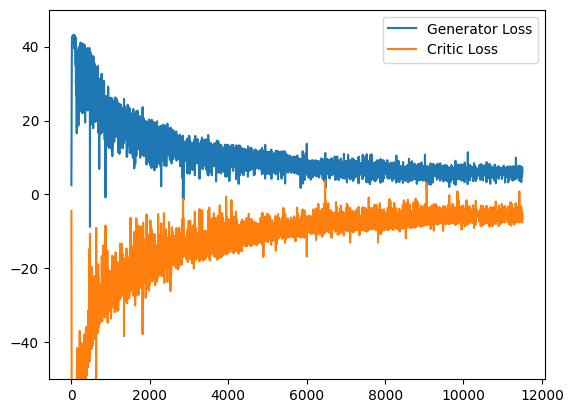

Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 146, Step 11600: Generator Loss: 6.064231872558594, Critic Loss: -5.089358329772949
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 148, Step 11700: Generator Loss: 7.138582229614258, Critic Loss: -6.81095552444458
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 149, Step 11800: Generator Loss: 7.806142330169678, Critic Loss: -4.249349594116211
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 150, Step 11900: Generator Loss: 6.90853214263916, Critic Loss: -6.455207824707031
Checkpoint saved successfully.


Checkpoint saved successfully.
------------ Generator LR has changed: 7.2e-05 -> 4.32e-05 (Epoch 151 - Step 11999) ------------
Epoch 151, Step 12000: Generator Loss: 6.7326340675354, Critic Loss: -4.434291839599609


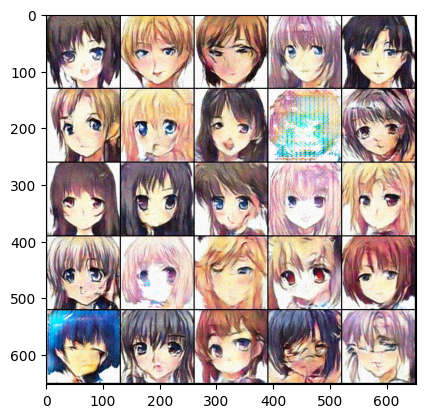

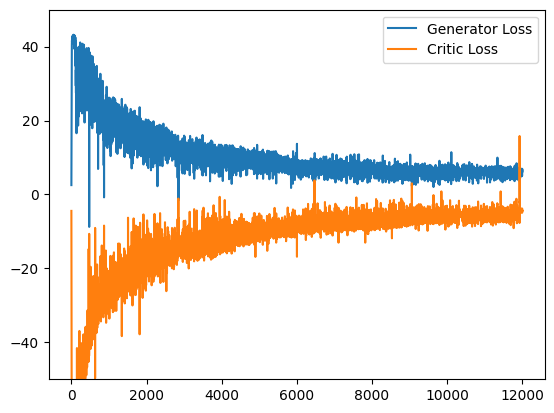

Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 153, Step 12100: Generator Loss: 6.690296649932861, Critic Loss: -6.391391754150391
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 154, Step 12200: Generator Loss: 5.390559196472168, Critic Loss: -2.925930976867676
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 155, Step 12300: Generator Loss: 3.695970058441162, Critic Loss: -2.945929527282715
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 156, Step 12400: Generator Loss: 6.881361961364746, Critic Loss: -6.750156879425049
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 158, Step 12500: Generator Loss: 7.163020610809326, Critic Loss: -5.300799369812012


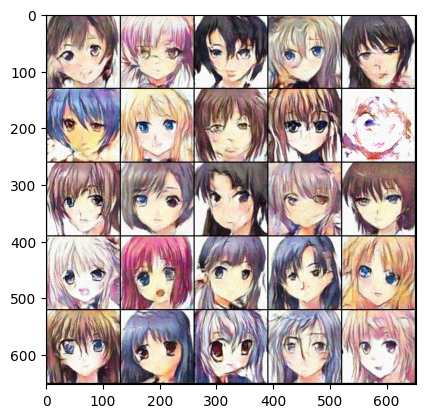

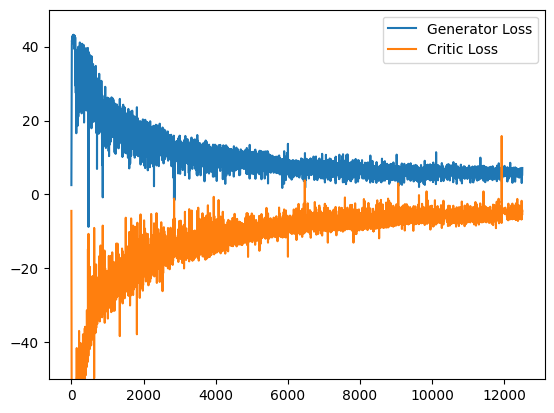

Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 159, Step 12600: Generator Loss: 6.303323745727539, Critic Loss: -5.061137676239014
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 160, Step 12700: Generator Loss: 4.9754743576049805, Critic Loss: -3.043706178665161
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 162, Step 12800: Generator Loss: 6.195033073425293, Critic Loss: -5.93477725982666
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 163, Step 12900: Generator Loss: 6.214582443237305, Critic Loss: -4.227876663208008
Checkpoint saved successfully.
Checkpoint saved successfully.


------------ Critic LR has changed: 0.0001715 -> 0.00012004999999999999 (Epoch 164 - Step 12999) ------------
Epoch 164, Step 13000: Generator Loss: 6.310441970825195, Critic Loss: -6.085882663726807


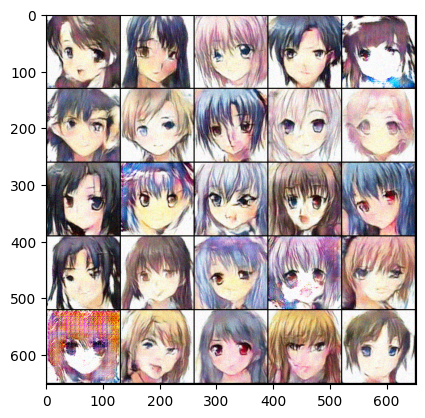

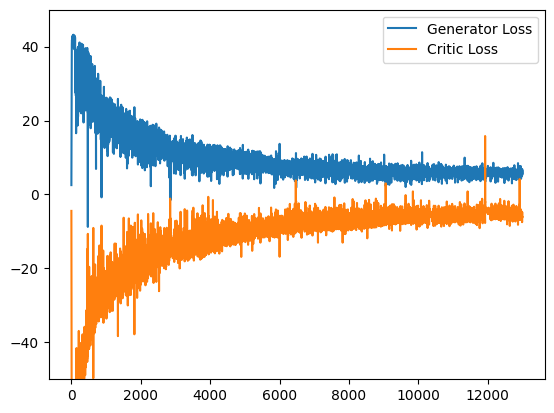

Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 165, Step 13100: Generator Loss: 6.653176307678223, Critic Loss: -5.990333080291748
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 167, Step 13200: Generator Loss: 6.823984146118164, Critic Loss: -7.101054668426514
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 168, Step 13300: Generator Loss: 8.181306838989258, Critic Loss: -4.877945899963379
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 169, Step 13400: Generator Loss: 6.412548542022705, Critic Loss: -6.043144702911377
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 170, Step 13500: Generator Loss: 6.444314002990723, Critic Loss: -5.530886173248291


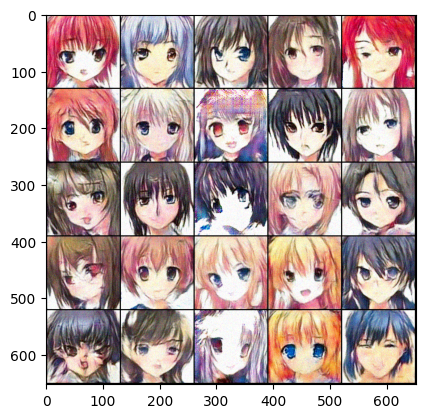

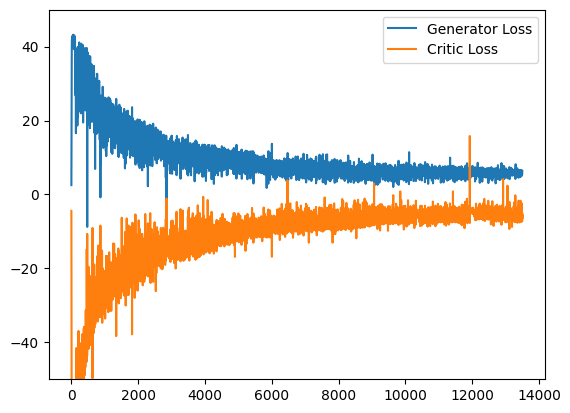

Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 172, Step 13600: Generator Loss: 6.605908393859863, Critic Loss: -5.467450141906738
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 173, Step 13700: Generator Loss: 5.720674514770508, Critic Loss: -5.712070941925049
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 174, Step 13800: Generator Loss: 6.259662628173828, Critic Loss: -5.341580390930176
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 175, Step 13900: Generator Loss: 7.221860408782959, Critic Loss: -3.9448444843292236
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 177, Step 14000: Generator Loss: 6.932417392730713, Critic Loss: -5.976792335510254


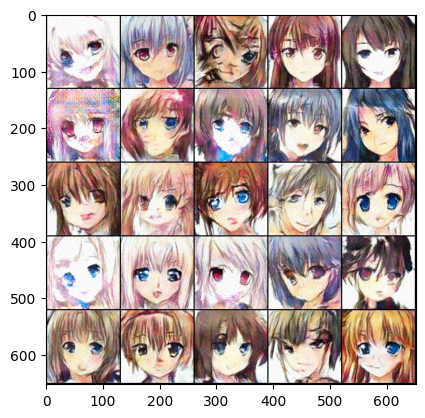

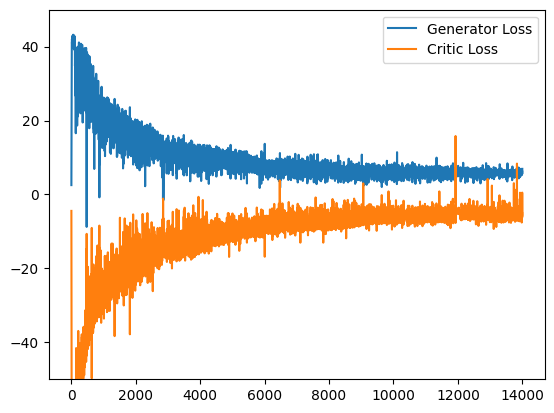

Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 178, Step 14100: Generator Loss: 7.6059250831604, Critic Loss: -3.944301128387451
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 179, Step 14200: Generator Loss: 6.52535343170166, Critic Loss: -5.795698642730713
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 181, Step 14300: Generator Loss: 5.957361698150635, Critic Loss: -6.034587860107422
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 182, Step 14400: Generator Loss: 5.28053617477417, Critic Loss: 2.5931239128112793
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 183, Step 14500: Generator Loss: 6.2202253341674805, Critic Loss: -6.327617645263672


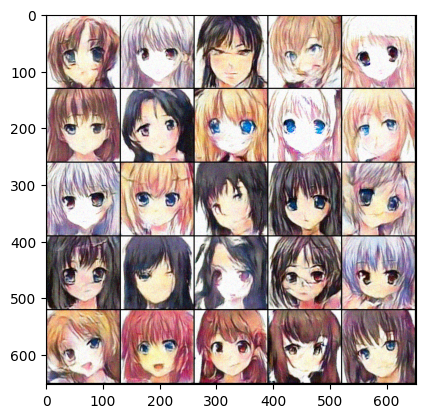

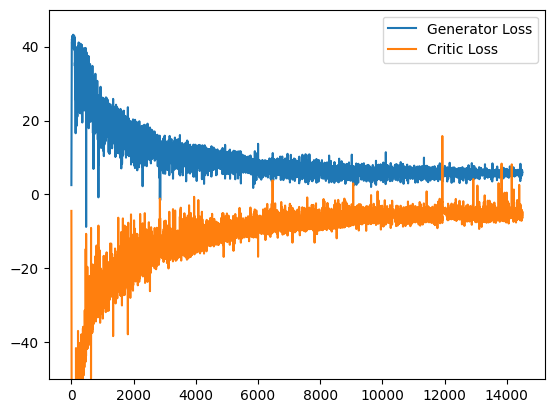

Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 184, Step 14600: Generator Loss: 6.2201642990112305, Critic Loss: -3.012648582458496
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 186, Step 14700: Generator Loss: 5.953548431396484, Critic Loss: -6.041835308074951
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 187, Step 14800: Generator Loss: 6.277350425720215, Critic Loss: -6.469294548034668
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 188, Step 14900: Generator Loss: 5.712393283843994, Critic Loss: -5.658734321594238
Checkpoint saved successfully.


Checkpoint saved successfully.
------------ Generator LR has changed: 4.32e-05 -> 2.592e-05 (Epoch 189 - Step 14999) ------------
Epoch 189, Step 15000: Generator Loss: 5.460349082946777, Critic Loss: -4.009426593780518


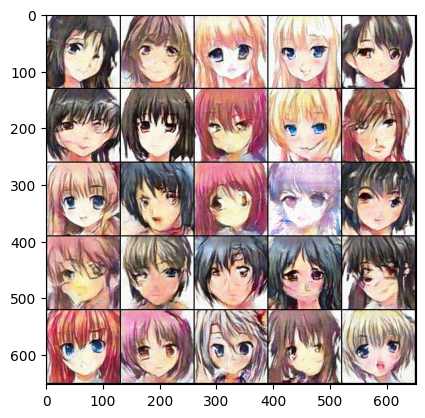

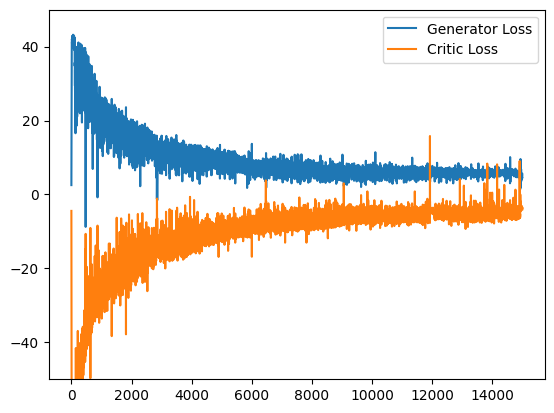

Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 191, Step 15100: Generator Loss: 6.783419132232666, Critic Loss: -4.045839786529541
Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 192, Step 15200: Generator Loss: 6.8761138916015625, Critic Loss: -5.862502098083496
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 193, Step 15300: Generator Loss: 6.392709732055664, Critic Loss: -6.360975742340088
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 194, Step 15400: Generator Loss: 6.194769859313965, Critic Loss: -6.081183910369873
Checkpoint saved successfully.


Checkpoint saved successfully.


Epoch 196, Step 15500: Generator Loss: 6.491772651672363, Critic Loss: -6.135645389556885


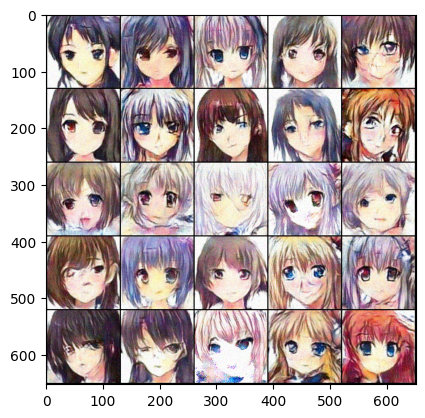

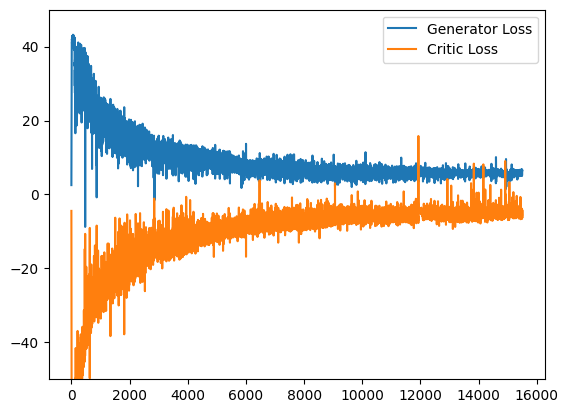

Checkpoint saved successfully.
Checkpoint saved successfully.


Epoch 197, Step 15600: Generator Loss: 6.352734565734863, Critic Loss: -6.2224040031433105
Checkpoint saved successfully.


Checkpoint saved successfully.
Epoch 198, Step 15700: Generator Loss: 6.377570152282715, Critic Loss: -5.94102668762207
Checkpoint saved successfully.


Checkpoint saved successfully.


In [ ]:
for epoch in range(n_epochs):
    for real, _ in tqdm(dataloader):
        real = real.to(device)

        # Critic training
        for _ in range(crit_cycles):
            crit_opt.zero_grad()
            fake_noise = gen_noise(len(real), z_dim, device=device)
            fake = gen(fake_noise)

            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            crit_loss = -(torch.mean(crit_real_pred) - torch.mean(crit_fake_pred))

            # Gradient penalty
            alpha = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gp = get_gp(real, fake.detach(), crit, alpha)
            crit_loss += gp

            crit_loss.backward()
            crit_opt.step()

        # Generator training
        gen_opt.zero_grad()
        fake_noise = gen_noise(len(real), z_dim, device=device)
        fake = gen(fake_noise)

        if cur_step > 6000 and cur_step % 20 == 0 :
            noise_strength = 0.05
            noise = torch.randn_like(fake) * noise_strength
            fake = fake + noise

        crit_fake_pred = crit(fake)
        gen_loss = -torch.mean(crit_fake_pred)

        gen_loss.backward()
        gen_opt.step()

        # Logging losses
        gen_losses.append(gen_loss.item())
        crit_losses.append(crit_loss.item())

        if cur_step % info_step == 0:
            print(f"Epoch {epoch}, Step {cur_step}: Generator Loss: {gen_loss.item()}, Critic Loss: {crit_loss.item()}")

        # Show generated samples every 'show_step' steps
        if cur_step % show_step == 0:
            show(fake, name=f"Generated image at step {cur_step} (Epoch {epoch})")

            plt.plot(
            range(len(gen_losses)),
            torch.Tensor(gen_losses),
            label="Generator Loss"
            )

            plt.plot(
                range(len(gen_losses)),
                torch.Tensor(crit_losses),
                label="Critic Loss"
            )

            plt.ylim(-50,50)
            plt.legend()
            plt.show()

        # Save model checkpoint every 'save_step' steps
        if cur_step % save_step == 0:
            save_checkpoint()


        # Between steps 3000 and 15000, the learning rates for the generator and critic are adjusted.
        # Initially, higher learning rates are used to balance the high losses,
        # but as the steps progress, the rates are lowered to stabilize the training.
        # The first 3000 steps are excluded from the StepLR process to ensure a stable convergence
        # phase for the GAN models and to facilitate faster learning.
        if 15000 >= cur_step >= 3000:
            # Check and adjust critic's learning rate
            old_crit_lr = crit_opt.param_groups[0]['lr']
            crit_scheduler.step()
            new_crit_lr = crit_opt.param_groups[0]['lr']
            if new_crit_lr != old_crit_lr:
                print(f"------------ Critic LR has changed: {old_crit_lr} -> {new_crit_lr} (Epoch {epoch} - Step {cur_step}) ------------")

            # Check and adjust generator's learning rate
            old_gen_lr = gen_opt.param_groups[0]['lr']
            gen_scheduler.step()
            new_gen_lr = gen_opt.param_groups[0]['lr']
            if new_gen_lr != old_gen_lr:
                print(f"------------ Generator LR has changed: {old_gen_lr} -> {new_gen_lr} (Epoch {epoch} - Step {cur_step}) ------------")

        cur_step += 1
